# Tokyo Metropolitan Area Population Density Map

This notebook visualizes population density using GeoPandas.

**Improvements made:**
- Removed unused / empty cells
- Fixed variable inconsistencies
- Added comments for clarity


## Visualization Notes

- Figure size is reduced for better GitHub rendering
- Text labels are minimized to avoid overlap
- Population density unit: people / km²


In [72]:
#!wget https://www.esrij.com/cgi-bin/wp/wp-content/uploads/2012/10/japan_ver84.zip

In [73]:
#!wget https://www.esrij.com/cgi-bin/wp/wp-content/uploads/2012/10/japan_ver821.zip

In [74]:
!pip install geodatasets


[notice] A new release of pip is available: 24.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [75]:
import geopandas as gpd
import folium
#!unzip -q /content/japan_ver84.zip

In [76]:
#!unzip -q /content/japan_ver83.zip

In [77]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

In [78]:
japan = gpd.read_file("extracted_data/japan_ver85/japan_ver85.shp")
japan.head()

,JCODE,KEN,SICHO,GUN,SEIREI,SIKUCHOSON,CITY_ENG,P_NUM,H_NUM,Shape_Leng,Shape_Area,geometry
0,01101,北海道,石狩振興局,None,札幌市,中央区,"Sapporo-shi, Chuo-ku",248680,141429,0.542590,0.005128,"POLYGON ((141.34233 43.06682, 141.3552 43.0685..."
1,01102,北海道,石狩振興局,None,札幌市,北区,"Sapporo-shi, Kita-ku",289323,139675,0.567773,0.007031,"POLYGON ((141.40839 43.18395, 141.40427 43.182..."
2,01103,北海道,石狩振興局,None,札幌市,東区,"Sapporo-shi, Higashi-ku",265379,131188,0.397203,0.006289,"POLYGON ((141.44698 43.15513, 141.4486 43.1532..."
3,01104,北海道,石狩振興局,None,札幌市,白石区,"Sapporo-shi, Shiroishi-ku",211835,108233,0.308211,0.003815,"POLYGON ((141.46569 43.1, 141.46812 43.09704, ..."
4,01105,北海道,石狩振興局,None,札幌市,豊平区,"Sapporo-shi, Toyohira-ku",225298,118650,0.428316,0.005101,"POLYGON ((141.38479 43.0466, 141.38558 43.0472..."


In [79]:
import zipfile
with zipfile.ZipFile('N02-21_GML.zip', 'r') as zip_ref:
    zip_ref.extractall('')

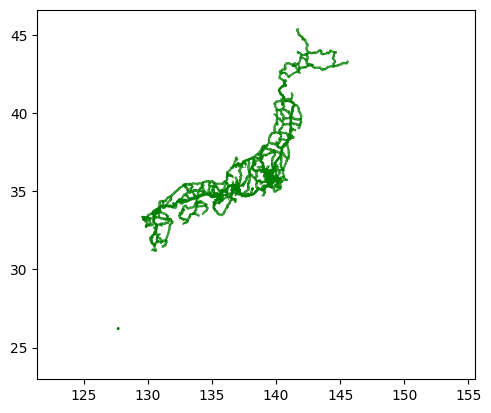

In [80]:

#japan2 =gpd.read_file('/content/N02-20_GML/N02-20_RailroadSection.shp')
japan2 = gpd.read_file('UTF-8/N02-21_RailroadSection.geojson')
base = japan2.plot(color='green', edgecolor='black')
japan.plot(ax=base, marker='o', color='white', markersize=0.5);

In [81]:
japan

,JCODE,KEN,SICHO,GUN,SEIREI,SIKUCHOSON,CITY_ENG,P_NUM,H_NUM,Shape_Leng,Shape_Area,geometry
0,01101,北海道,石狩振興局,None,札幌市,中央区,"Sapporo-shi, Chuo-ku",248680,141429,0.542590,0.005128,"POLYGON ((141.34233 43.06682, 141.3552 43.0685..."
1,01102,北海道,石狩振興局,None,札幌市,北区,"Sapporo-shi, Kita-ku",289323,139675,0.567773,0.007031,"POLYGON ((141.40839 43.18395, 141.40427 43.182..."
2,01103,北海道,石狩振興局,None,札幌市,東区,"Sapporo-shi, Higashi-ku",265379,131188,0.397203,0.006289,"POLYGON ((141.44698 43.15513, 141.4486 43.1532..."
3,01104,北海道,石狩振興局,None,札幌市,白石区,"Sapporo-shi, Shiroishi-ku",211835,108233,0.308211,0.003815,"POLYGON ((141.46569 43.1, 141.46812 43.09704, ..."
4,01105,北海道,石狩振興局,None,札幌市,豊平区,"Sapporo-shi, Toyohira-ku",225298,118650,0.428316,0.005101,"POLYGON ((141.38479 43.0466, 141.38558 43.0472..."
...,...,...,...,...,...,...,...,...,...,...,...,...
1902,47362,沖縄県,None,島尻郡,None,八重瀬町,Yaese-cho,30941,10680,0.288020,0.002441,"MULTIPOLYGON (((127.76117 26.124, 127.76255 26..."
1903,47375,沖縄県,None,宮古郡,None,多良間村,Tarama-son,1058,466,0.247357,0.001956,"MULTIPOLYGON (((124.73021 24.64206, 124.73135 ..."
1904,47381,沖縄県,None,八重山郡,None,竹富町,Taketomi-cho,3942,2093,2.158236,0.029741,"MULTIPOLYGON (((123.76601 24.06841, 123.7638 2..."
1905,47382,沖縄県,None,八重山郡,None,与那国町,Yonaguni-cho,1676,760,0.314766,0.002570,"MULTIPOLYGON (((123.00349 24.47277, 123.00128 ..."


In [82]:
japan.Shape_Area*=10000
japan['dens']=japan.P_NUM/japan.Shape_Area


In [83]:
japan.columns

Index(['JCODE', 'KEN', 'SICHO', 'GUN', 'SEIREI', 'SIKUCHOSON', 'CITY_ENG',
       'P_NUM', 'H_NUM', 'Shape_Leng', 'Shape_Area', 'geometry', 'dens'],
      dtype='object')

In [84]:
c=japan[japan['KEN']=='千葉県'].groupby('CITY_ENG')[['Shape_Leng','Shape_Area','P_NUM','dens']].agg(np.sum)

C:\Users\user\AppData\Local\Temp\ipykernel_12132\3028156874.py:1: FutureWarning: The provided callable <function sum at 0x000001F449620360> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  c=japan[japan['KEN']=='千葉県'].groupby('CITY_ENG')[['Shape_Leng','Shape_Area','P_NUM','dens']].agg(np.sum)


In [85]:
c

,Shape_Leng,Shape_Area,P_NUM,dens
CITY_ENG,,,,
Abiko-shi,0.431752,43.043426,130510,3032.054178
Asahi-shi,0.920298,129.933175,63745,490.598341
"Chiba-shi, Chuo-ku",0.558589,44.433463,211736,4765.237372
"Chiba-shi, Hanamigawa-ku",0.401594,34.028108,177328,5211.221333
"Chiba-shi, Inage-ku",0.295270,21.184544,160582,7580.149074
"Chiba-shi, Midori-ku",0.654422,65.859587,129421,1965.104935
"Chiba-shi, Mihama-ku",0.282412,21.085303,148944,7063.877586
"Chiba-shi, Wakaba-ku",0.665246,83.695042,146940,1755.659547
Chonan-machi,0.490930,65.007191,7198,110.726212


In [86]:
pop_data = japan[['KEN','P_NUM','Shape_Area']].groupby('KEN').agg(np.sum).reset_index()
pop_data['Pop_dens']=pop_data.P_NUM/pop_data.Shape_Area

C:\Users\user\AppData\Local\Temp\ipykernel_12132\22126048.py:1: FutureWarning: The provided callable <function sum at 0x000001F449620360> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  pop_data = japan[['KEN','P_NUM','Shape_Area']].groupby('KEN').agg(np.sum).reset_index()


In [87]:
pop_data.head()

,KEN,P_NUM,Shape_Area,Pop_dens
0,三重県,1770254,5670.957889,312.161373
1,京都府,2578085,4568.992555,564.256774
2,佐賀県,811442,2362.582785,343.455478
3,兵庫県,5465002,8299.793390,658.450367
4,北海道,5224608,92812.081701,56.292326


In [88]:
pop_sum=pop_data['P_NUM'].sum()
squared=pop_data['Shape_Area'].sum()
pop_data['dense_rank']=pop_data['Pop_dens'].rank(ascending=False).astype(int)
pop_data['pop_rank']=pop_data['P_NUM'].rank(ascending=False).astype(int)
pop_data['share']=pop_data['P_NUM']/pop_sum*100
pop_data['s_share']=pop_data['Shape_Area']/squared*100
pop_data.sort_values(by='Pop_dens',ascending=False)


,KEN,P_NUM,Shape_Area,Pop_dens,dense_rank,pop_rank,share,s_share
26,東京都,14047557,2168.827088,6477.029486,1,1,11.135947,0.560674
9,大阪府,8837685,1872.721523,4719.166672,2,3,7.005915,0.484127
32,神奈川県,9237337,2398.181053,3851.809682,3,2,7.322732,0.619966
7,埼玉県,7344765,3796.019332,1934.859746,4,5,5.822430,0.981328
24,愛知県,7542414,5110.320130,1475.918104,5,4,5.979113,1.321095
5,千葉県,6284480,5126.456006,1225.891726,6,6,4.981908,1.325266
34,福岡県,5135212,4840.484599,1060.887995,7,9,4.070847,1.251338
28,沖縄県,1467480,2055.270050,714.008361,8,25,1.163318,0.531318
3,兵庫県,5465002,8299.793390,658.450367,9,7,4.332282,2.145622
1,京都府,2578085,4568.992555,564.256774,10,13,2.043730,1.181153


In [89]:
import pandas as pd

# Assuming you have your DataFrame named 'df' with the data you provided

# Create a dictionary mapping Japanese prefecture names to English names
prefecture_names = {
    '三重県': 'Mie',
    '京都府': 'Kyoto',
    '佐賀県': 'Saga',
    '兵庫県': 'Hyogo',
    '北海道': 'Hokkaido',
    '千葉県': 'Chiba',
    '和歌山県': 'Wakayama',
    '埼玉県': 'Saitama',
    '大分県': 'Oita',
    '大阪府': 'Osaka',
    '奈良県': 'Nara',
    '宮城県': 'Miyagi',
    '宮崎県': 'Miyazaki',
    '富山県': 'Toyama',
    '山口県': 'Yamaguchi',
    '山形県': 'Yamagata',
    '山梨県': 'Yamanashi',
    '岐阜県': 'Gifu',
    '岡山県': 'Okayama',
    '岩手県': 'Iwate',
    '島根県': 'Shimane',
    '広島県': 'Hiroshima',
    '徳島県': 'Tokushima',
    '愛媛県': 'Ehime',
    '愛知県': 'Aichi',
    '新潟県': 'Niigata',
    '東京都': 'Tokyo',
    '栃木県': 'Tochigi',
    '沖縄県': 'Okinawa',
    '滋賀県': 'Shiga',
    '熊本県': 'Kumamoto',
    '石川県': 'Ishikawa',
    '神奈川県': 'Kanagawa',
    '福井県': 'Fukui',
    '福岡県': 'Fukuoka',
    '福島県': 'Fukushima',
    '秋田県': 'Akita',
    '群馬県': 'Gunma',
    '茨城県': 'Ibaraki',
    '長崎県': 'Nagasaki',
    '長野県': 'Nagano',
    '青森県': 'Aomori',
    '静岡県': 'Shizuoka',
    '香川県': 'Kagawa',
    '高知県': 'Kochi',
    '鳥取県': 'Tottori',
    '鹿児島県': 'Kagoshima'
}

# Map the 'KEN' column values to the English names using the dictionary
pop_data['pref'] = pop_data['KEN'].map(prefecture_names)
#pop_data.Pop_dens=pop_data.Pop_dens.astype(int)
# Print the updated DataFrame
pop_data=pop_data[['dense_rank','Pop_dens','pop_rank','P_NUM','KEN','pref','share','s_share']]
pop_data


,dense_rank,Pop_dens,pop_rank,P_NUM,KEN,pref,share,s_share
0,19,312.161373,22,1770254,三重県,Mie,1.403337,1.466028
1,10,564.256774,13,2578085,京都府,Kyoto,2.043730,1.181153
2,16,343.455478,41,811442,佐賀県,Saga,0.643256,0.610763
3,9,658.450367,7,5465002,兵庫県,Hyogo,4.332282,2.145622
4,47,56.292326,8,5224608,北海道,Hokkaido,4.141714,23.993322
5,6,1225.891726,6,6284480,千葉県,Chiba,4.981908,1.325266
6,29,200.281037,40,922584,和歌山県,Wakayama,0.731362,1.190836
7,4,1934.859746,5,7344765,埼玉県,Saitama,5.822430,0.981328
8,32,183.265055,34,1123852,大分県,Oita,0.890913,1.585314
9,2,4719.166672,3,8837685,大阪府,Osaka,7.005915,0.484127


In [90]:
ken = japan.dissolve(by='KEN')
japan2.plot(ax=base, color='green', edgecolor='black')


<Axes: >

In [91]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# Dissolve the 'japan' GeoDataFrame by 'KEN'
pop_data['share'] = pop_data['share'].round(2)
pop_data['s_share'] = pop_data['s_share'].round(2)

# Merge 'ken' and 'pop_data'
joined = ken.merge(pop_data, on='KEN')

# Plot the 'Pop_dens' column
joined['Pop_dens'] = joined['Pop_dens'].astype(float).round(2)
#japan2 = gpd.read_file('/content/N02-20_GML/N02-20_RailroadSection.geojson')
#base = japan2.plot(color='green', edgecolor='black')
#joined.plot(ax=base)
joined.plot(column='Pop_dens', cmap='YlOrRd', legend=True, edgecolor='b', linewidth=0.5, figsize=(100, 100))

# Annotate prefecture names and population on the map
for x, y, pref, population in zip(joined.geometry.centroid.x, joined.geometry.centroid.y, joined['pref'], joined['Pop_dens']):
    plt.annotate(text=pref, xy=(x, y), xytext=(0, 30), textcoords='offset points', fontsize=30, color='black')
    plt.annotate(text=str(population), xy=(x, y), xytext=(0, -10), textcoords='offset points', fontsize=30, color='black')

# Sort population data by 'Pop_dens'
dens = pop_data.sort_values(by='Pop_dens', ascending=False)
dens['Pop_dens'] = dens['Pop_dens'].astype(float).round(2)

# Create and format the table
table = plt.table(cellText=dens[['dense_rank', 'pref', 'Pop_dens', 'share', 's_share']].values,
                  colLabels=['Rank', 'Prefecture', 'Population Density', 'Population Percentage', 'Area Percentage'],
                  loc='lower right')
table.auto_set_font_size(False)
table.set_fontsize(30)
table.scale(0.3, 3)

# Set the plot title
plt.title('Japanese Population Density Map', fontdict={'fontsize': 200})

# Plot the 'japan2' GeoDataFrame

#merged = gpd.overlay(japan2, joined, how='intersection')
# Show the plot
plt.show()


C:\Users\user\AppData\Local\Temp\ipykernel_12132\1558711131.py:20: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, pref, population in zip(joined.geometry.centroid.x, joined.geometry.centroid.y, joined['pref'], joined['Pop_dens']):


In [93]:

# Dissolve the 'japan' GeoDataFrame by 'KEN'


# Drop the 'dens' column from the 'ken' GeoDataFrame
#ken = ken.drop('dens', axis=1).reset_index()
#print(ken.columns)
# Concatenate 'ken' and 'pop_data'
#joined = pd.concat([ken, pop_data])
joined = ken.merge(pop_data,on=['KEN'])
#print(joined.head())
# Plot the 'dens' column
joined.plot(column='P_NUM_y', cmap='YlOrRd', legend=True, edgecolor='b', linewidth=0.5, figsize=(100, 100))

for x, y, pref, population in zip(joined.geometry.centroid.x, joined.geometry.centroid.y, joined['pref'], joined['P_NUM_y']):
    #print(pref)
    plt.annotate(text=pref, xy=(x, y), xytext=(0, 30), textcoords='offset points', fontsize=30, color='black')
    plt.annotate(text=str(population), xy=(x, y), xytext=(0, -10), textcoords='offset points', fontsize=30, color='black')
dens=pop_data.sort_values(by='P_NUM',ascending=False)

table=plt.table(cellText=dens[['pop_rank','pref','P_NUM','share','s_share']].values,colLabels=['rank','prefecture','population','population_share','area_share'],loc='lower right')
table.auto_set_font_size(False)
table.set_fontsize(30)
table.scale(0.3, 3)
plt.title('Japanese Population Map', fontdict={'fontsize': 200})
#plt.plot(ax=base)
plt.show()


C:\Users\user\AppData\Local\Temp\ipykernel_12132\2481484454.py:14: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, pref, population in zip(joined.geometry.centroid.x, joined.geometry.centroid.y, joined['pref'], joined['P_NUM_y']):


<Figure size 1000x1000 with 0 Axes>

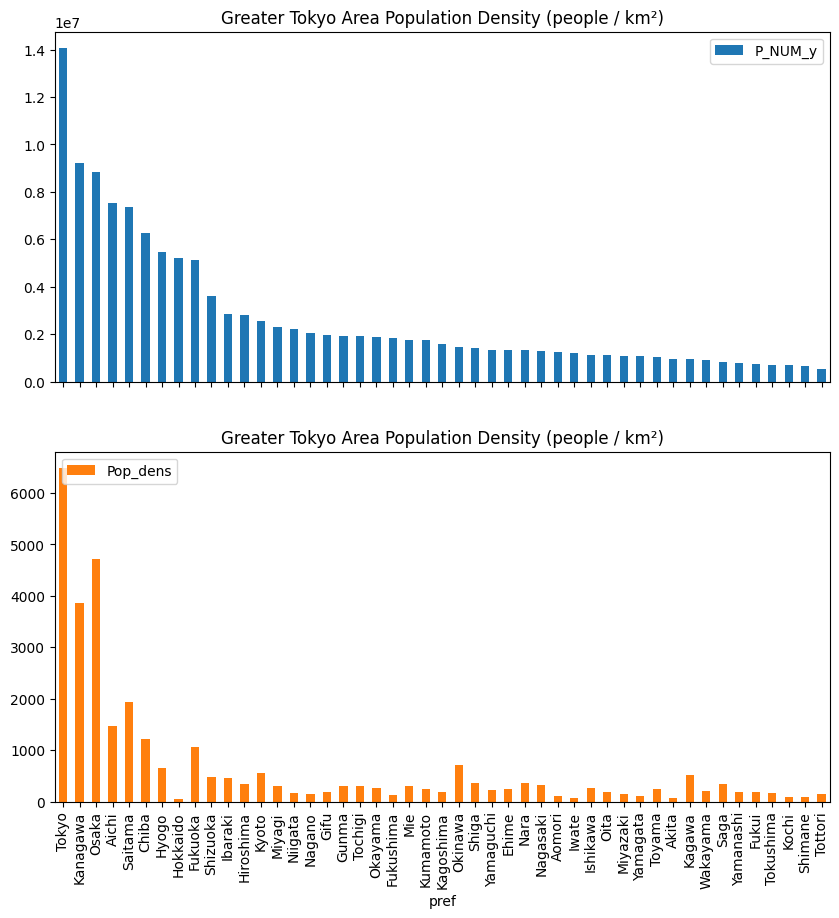

In [94]:
prefecture = joined[['pref', 'P_NUM_y','Pop_dens']]
chiba_sorted = prefecture.sort_values('P_NUM_y', ascending=False)  # Sort the DataFrame by 'P_NUM_x' column

plt.figure(figsize=(10, 10))
ax = chiba_sorted.plot.bar('pref', rot=90, subplots=True, figsize=(10, 10))
ax[0].set_title('Greater Tokyo Area Population Density (people / km²)')  # Set the title for the first chart
ax[1].legend(loc=2)
ax[1].set_title('Greater Tokyo Area Population Density (people / km²)')  # Set the title for the second chart
plt.show()


In [95]:
joined.columns

Index(['KEN', 'geometry', 'JCODE', 'SICHO', 'GUN', 'SEIREI', 'SIKUCHOSON',
       'CITY_ENG', 'P_NUM_x', 'H_NUM', 'Shape_Leng', 'Shape_Area', 'dens',
       'dense_rank', 'Pop_dens', 'pop_rank', 'P_NUM_y', 'pref', 'share',
       's_share'],
      dtype='object')

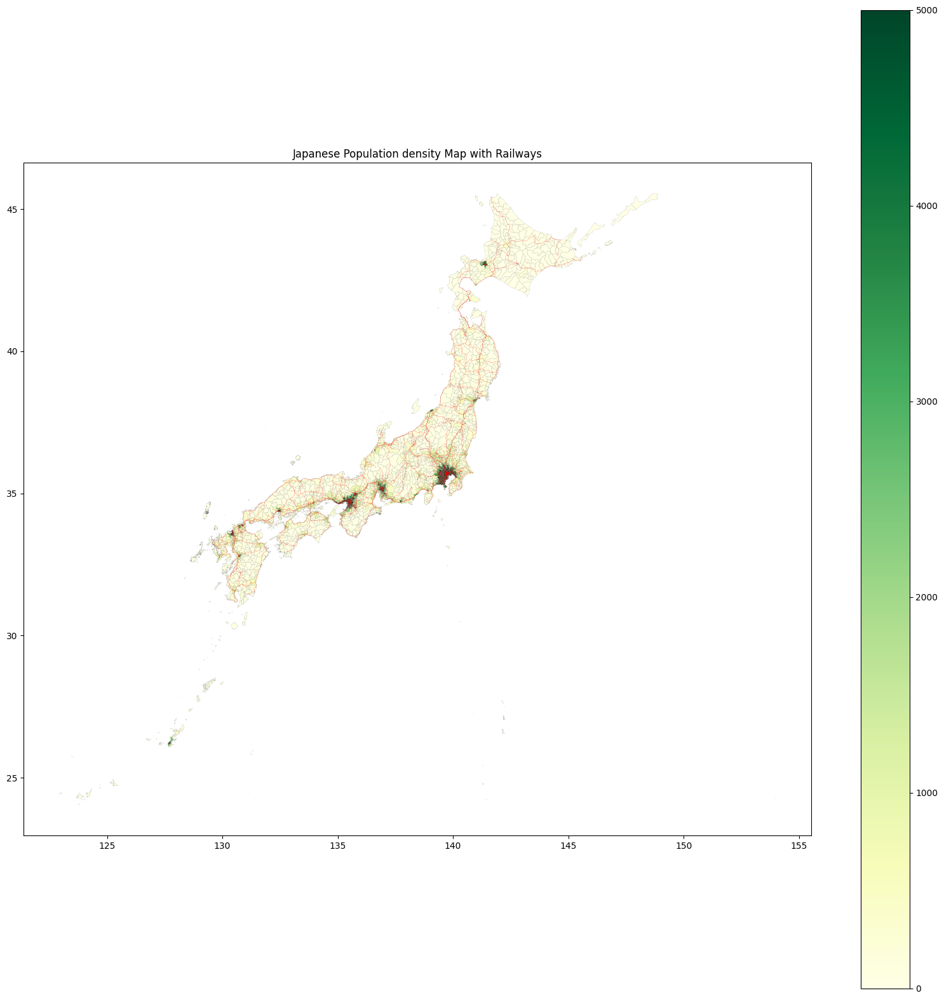

In [96]:
railways = gpd.read_file("UTF-8/N02-21_RailroadSection.shp") 

railways = railways.to_crs(japan.crs)
ax = japan.plot(column='dens', cmap='YlGn', legend=True, 
                vmax=5000, 
                edgecolor='gray', linewidth=0.1, figsize=(20, 20))

railways.plot(ax=ax, color='red', linewidth=0.2, alpha=0.8)

plt.title('Japanese Population density Map with Railways')

plt.savefig('railway_popdens.png', dpi=300, bbox_inches='tight')

plt.show() 

In [97]:
pop_data['s_share'].sum()

99.98000000000002

Text(0.5, 1.0, 'Japanese Population Map')

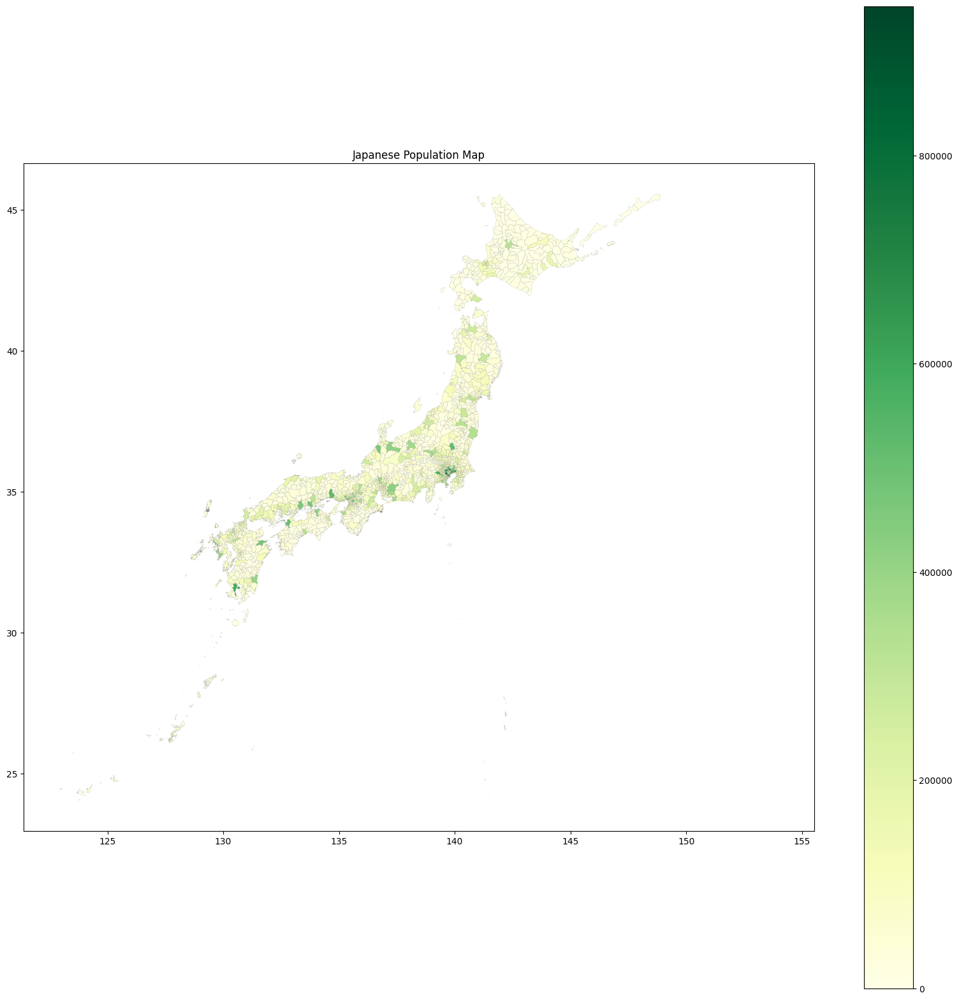

In [98]:
japan.plot(column='P_NUM', cmap='YlGn', legend=True,edgecolor='gray', linewidth=0.1, figsize=(20, 20))
plt.title('Japanese Population Map')

In [99]:
city = japan[['KEN','CITY_ENG','P_NUM','Shape_Area']].groupby(['CITY_ENG']).agg(np.sum).dropna().reset_index()
city['Pop_dens']=city.P_NUM/city.Shape_Area
city['d_rank']=city['Pop_dens'].rank(ascending=False).astype(int)
city['p_rank']=city['P_NUM'].rank(ascending=False).astype(int)
city=city[city['P_NUM']!=0]
city.sort_values(by='Pop_dens',ascending=False).tail(100)

C:\Users\user\AppData\Local\Temp\ipykernel_12132\34907689.py:1: FutureWarning: The provided callable <function sum at 0x000001F449620360> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  city = japan[['KEN','CITY_ENG','P_NUM','Shape_Area']].groupby(['CITY_ENG']).agg(np.sum).dropna().reset_index()


,CITY_ENG,KEN,P_NUM,Shape_Area,Pop_dens,d_rank,p_rank
1165,Okuma-machi,福島県,847,80.006843,10.586594,1750,1823
1257,Rausu-cho,北海道,4722,446.783510,10.568877,1751,1588
623,Kimobetsu-cho,北海道,2156,208.011894,10.364792,1752,1751
508,Kamikawa-cho,北海道兵庫県,14116,1372.996262,10.281164,1753,1225
6,Aga-machi,新潟県,9965,973.044059,10.241057,1754,1353
...,...,...,...,...,...,...,...
1237,Otoineppu-mura,北海道,706,313.061568,2.255147,1845,1830
1422,Shimukappu-mura,北海道,1306,630.750014,2.070551,1846,1798
510,Kamikitayama-mura,奈良県,444,267.932871,1.657131,1847,1839
363,Horokanai-cho,北海道,1370,864.080904,1.585500,1848,1793


In [100]:
prefecture.columns

Index(['pref', 'P_NUM_y', 'Pop_dens'], dtype='object')

In [ ]:
prefecture=japan[japan['KEN']=='千葉県']
prefecture['dense_rank']=prefecture['dens'].rank(ascending=False).astype(int)
prefecture['pop_rank']=prefecture['P_NUM'].rank(ascending=False).astype(int)
#prefecture.sort_values(by='dens',ascending=False)
prefecture = prefecture.merge(city,on=['CITY_ENG'])
#fig, ax = plt.subplots()
#prefecture.plot(ax=ax, marker='o', color='green', markersize=0.5,geo='geometry')
prefecture.plot(column='dens', cmap='YlOrRd', legend=True,edgecolor='b', linewidth=0.5, figsize=(100, 100))
for x, y, l,n,pref, population in zip(prefecture.geometry.centroid.x, prefecture.geometry.centroid.y,prefecture['dense_rank'],prefecture['d_rank'], prefecture['CITY_ENG'], prefecture['dens']):
    #print(pref)
    plt.annotate(text=str(l)+'('+str(n)+')', xy=(x, y), xytext=(0, -50), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=pref, xy=(x, y), xytext=(0, 35), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=int(population), xy=(x, y), xytext=(0, -10), textcoords='offset points', fontsize=35, color='black')
dens=prefecture.sort_values(by='dens',ascending=False)
dens['dens']=dens['dens'].round(2)
dens=dens.iloc[0:60,:]
table=plt.table(cellText=dens[['dense_rank','CITY_ENG','dens']].values,colLabels=['rank','city','population_density'],loc='left')
table.auto_set_font_size(False)
table.set_fontsize(35)
table.scale(0.35, 4)

plt.title('Chiba Population density Map', fontdict={'fontsize': 200})


In [ ]:
prefecture.plot(column='P_NUM_x', cmap='YlOrRd', legend=True,edgecolor='b', linewidth=0.5, figsize=(100, 100))
for x, y, l,n,pref, population in zip(prefecture.geometry.centroid.x, prefecture.geometry.centroid.y,prefecture['pop_rank'],prefecture['p_rank'], prefecture['CITY_ENG'], prefecture['P_NUM_x']):
    #print(pref)
    plt.annotate(text=str(l)+'('+str(n)+')', xy=(x, y), xytext=(0, -50), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=pref, xy=(x, y), xytext=(0, 35), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=int(population), xy=(x, y), xytext=(0, -10), textcoords='offset points', fontsize=35, color='black')
dens=prefecture.sort_values(by='P_NUM_x',ascending=False)
#dens['dens']=dens['dens'].round(2)
dens=dens.iloc[:60,:]
table=plt.table(cellText=dens[['pop_rank','CITY_ENG','P_NUM_x']].values,colLabels=['rank','city','population'],loc='left')
table.auto_set_font_size(False)
table.set_fontsize(35)
table.scale(0.35, 4)

plt.title('Chiba Population Map', fontdict={'fontsize': 200})


#prefecture.plot(column='P_NUM', cmap='YlGn', legend=True,edgecolor='gray', linewidth=0.1, figsize=(10, 10))
#plt.title('Chiba Population Map')

In [ ]:
prefecture = prefecture[['CITY_ENG', 'P_NUM_x', 'dens']]
chiba_sorted = prefecture.sort_values('P_NUM_x', ascending=False)  # Sort the DataFrame by 'P_NUM_x' column

plt.figure(figsize=(10, 10))
ax = chiba_sorted.plot.bar('CITY_ENG', rot=90, subplots=True, figsize=(10, 10))
ax[0].set_title('Greater Tokyo Area Population Density (people / km²)')  # Set the title for the first chart
ax[1].legend(loc=2)
ax[1].set_title('Greater Tokyo Area Population Density (people / km²)')  # Set the title for the second chart
plt.show()


In [ ]:
prefecture=japan[japan['KEN']=='神奈川県']
prefecture['dense_rank']=prefecture['dens'].rank(ascending=False).astype(int)
prefecture['pop_rank']=prefecture['P_NUM'].rank(ascending=False).astype(int)
#prefecture.sort_values(by='dens',ascending=False)
prefecture = prefecture.merge(city,on=['CITY_ENG'])
prefecture.plot(column='dens', cmap='YlOrRd', legend=True,edgecolor='b', linewidth=0.5, figsize=(100, 100))
for x, y, l,n,pref, population in zip(prefecture.geometry.centroid.x, prefecture.geometry.centroid.y,prefecture['dense_rank'],prefecture['d_rank'], prefecture['CITY_ENG'], prefecture['dens']):
    #print(pref)
    plt.annotate(text=str(l)+'('+str(n)+')', xy=(x, y), xytext=(0, -50), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=pref, xy=(x, y), xytext=(0, 35), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=int(population), xy=(x, y), xytext=(0, -10), textcoords='offset points', fontsize=35, color='black')
dens=prefecture.sort_values(by='dens',ascending=False)
dens['dens']=dens['dens'].round(2)
#dens=dens.iloc[0:60,:]
table=plt.table(cellText=dens[['dense_rank','CITY_ENG','dens']].values,colLabels=['rank','city','population_density'],loc='left')
table.auto_set_font_size(False)
table.set_fontsize(35)
table.scale(0.4, 4)

plt.title('Kanagawa Population density Map', fontdict={'fontsize': 200});


In [ ]:
prefecture.plot(column='P_NUM_x', cmap='YlOrRd', legend=True,edgecolor='b', linewidth=0.5, figsize=(100, 100))
for x, y, l,n,pref, population in zip(prefecture.geometry.centroid.x, prefecture.geometry.centroid.y,prefecture['pop_rank'],prefecture['p_rank'], prefecture['CITY_ENG'], prefecture['P_NUM_x']):
    #print(pref)
    plt.annotate(text=str(l)+'('+str(n)+')', xy=(x, y), xytext=(0, -50), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=pref, xy=(x, y), xytext=(0, 35), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=int(population), xy=(x, y), xytext=(0, -10), textcoords='offset points', fontsize=35, color='black')
dens=prefecture.sort_values(by='P_NUM_x',ascending=False)
#dens['dens']=dens['dens'].round(2)
#dens=dens.iloc[:60,:]
table=plt.table(cellText=dens[['pop_rank','CITY_ENG','P_NUM_x']].values,colLabels=['rank','city','population'],loc='left')
table.auto_set_font_size(False)
table.set_fontsize(35)
table.scale(0.4, 4)

plt.title('Kanagawa Population Map', fontdict={'fontsize': 200});


#prefecture.plot(column='P_NUM', cmap='YlGn', legend=True,edgecolor='gray', linewidth=0.1, figsize=(10, 10))
#plt.title('Chiba Population Map')

In [ ]:
prefecture=japan[japan['KEN']=='埼玉県']
prefecture['dense_rank']=prefecture['dens'].rank(ascending=False).astype(int)
prefecture['pop_rank']=prefecture['P_NUM'].rank(ascending=False).astype(int)
#prefecture.sort_values(by='dens',ascending=False)
prefecture = prefecture.merge(city,on=['CITY_ENG'])
prefecture.plot(column='dens', cmap='YlOrRd', legend=True,edgecolor='b', linewidth=0.5, figsize=(100, 100))
for x, y, l,n,pref, population in zip(prefecture.geometry.centroid.x, prefecture.geometry.centroid.y,prefecture['dense_rank'],prefecture['d_rank'], prefecture['CITY_ENG'], prefecture['dens']):
    #print(pref)
    plt.annotate(text=str(l)+'('+str(n)+')', xy=(x, y), xytext=(0, -50), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=pref, xy=(x, y), xytext=(0, 35), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=int(population), xy=(x, y), xytext=(0, -10), textcoords='offset points', fontsize=35, color='black')
dens=prefecture.sort_values(by='dens',ascending=False)
dens['dens']=dens['dens'].round(2)
#dens=dens.iloc[0:60,:]
table=plt.table(cellText=dens[['dense_rank','CITY_ENG','dens']].values,colLabels=['rank','city','population_density'],loc='left')
table.auto_set_font_size(False)
table.set_fontsize(35)
table.scale(0.4, 4)

plt.title('Saitama Population density Map', fontdict={'fontsize': 200});


In [ ]:
prefecture = prefecture[['CITY_ENG', 'P_NUM_x', 'dens']]
chiba_sorted = prefecture.sort_values('P_NUM_x', ascending=False)  # Sort the DataFrame by 'P_NUM_x' column

plt.figure(figsize=(10, 10))
ax = chiba_sorted.plot.bar('CITY_ENG', rot=90, subplots=True, figsize=(10, 10))
ax[0].set_title('Greater Tokyo Area Population Density (people / km²)')  # Set the title for the first chart
ax[1].legend(loc=2)
ax[1].set_title('Greater Tokyo Area Population Density (people / km²)')  # Set the title for the second chart
plt.show()


In [ ]:
prefecture=japan[japan['KEN']=='愛知県']
prefecture['dense_rank']=prefecture['dens'].rank(ascending=False).astype(int)
prefecture['pop_rank']=prefecture['P_NUM'].rank(ascending=False).astype(int)
#prefecture.sort_values(by='dens',ascending=False)
prefecture = prefecture.merge(city,on=['CITY_ENG'])
prefecture.plot(column='dens', cmap='YlOrRd', legend=True,edgecolor='b', linewidth=0.5, figsize=(100, 100))
for x, y, l,n,pref, population in zip(prefecture.geometry.centroid.x, prefecture.geometry.centroid.y,prefecture['dense_rank'],prefecture['d_rank'], prefecture['CITY_ENG'], prefecture['dens']):
    #print(pref)
    plt.annotate(text=str(l)+'('+str(n)+')', xy=(x, y), xytext=(0, -50), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=pref, xy=(x, y), xytext=(0, 35), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=int(population), xy=(x, y), xytext=(0, -10), textcoords='offset points', fontsize=35, color='black')
dens=prefecture.sort_values(by='dens',ascending=False)
dens['dens']=dens['dens'].round(2)
#dens=dens.iloc[0:60,:]
table=plt.table(cellText=dens[['dense_rank','CITY_ENG','dens']].values,colLabels=['rank','city','population_density'],loc='left')
table.auto_set_font_size(False)
table.set_fontsize(35)
table.scale(0.4, 4)

plt.title('Aichi Population density Map', fontdict={'fontsize': 200});


In [ ]:
prefecture.plot(column='P_NUM_x', cmap='YlOrRd', legend=True,edgecolor='b', linewidth=0.5, figsize=(100, 100))
for x, y, l,n,pref, population in zip(prefecture.geometry.centroid.x, prefecture.geometry.centroid.y,prefecture['pop_rank'],prefecture['p_rank'], prefecture['CITY_ENG'], prefecture['P_NUM_x']):
    #print(pref)
    plt.annotate(text=str(l)+'('+str(n)+')', xy=(x, y), xytext=(0, -50), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=pref, xy=(x, y), xytext=(0, 35), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=int(population), xy=(x, y), xytext=(0, -10), textcoords='offset points', fontsize=35, color='black')
dens=prefecture.sort_values(by='P_NUM_x',ascending=False)
#dens['dens']=dens['dens'].round(2)
#dens=dens.iloc[:60,:]
table=plt.table(cellText=dens[['pop_rank','CITY_ENG','P_NUM_x']].values,colLabels=['rank','city','population'],loc='left')
table.auto_set_font_size(False)
table.set_fontsize(35)
table.scale(0.4, 4)

plt.title('Aichi Population Map', fontdict={'fontsize': 200});


#prefecture.plot(column='P_NUM', cmap='YlGn', legend=True,edgecolor='gray', linewidth=0.1, figsize=(10, 10))
#plt.title('Chiba Population Map')

In [ ]:
prefecture = prefecture[['CITY_ENG', 'P_NUM_x', 'dens']]
chiba_sorted = prefecture.sort_values('P_NUM_x', ascending=False)  # Sort the DataFrame by 'P_NUM_x' column

plt.figure(figsize=(10, 10))
ax = chiba_sorted.plot.bar('CITY_ENG', rot=90, subplots=True, figsize=(10, 10))
ax[0].set_title('Greater Tokyo Area Population Density (people / km²)')  # Set the title for the first chart
ax[1].legend(loc=2)
ax[1].set_title('Greater Tokyo Area Population Density (people / km²)')  # Set the title for the second chart
plt.show()


In [ ]:
prefecture=japan[japan['KEN']=='大阪府']
prefecture['dense_rank']=prefecture['dens'].rank(ascending=False).astype(int)
prefecture['pop_rank']=prefecture['P_NUM'].rank(ascending=False).astype(int)
#prefecture.sort_values(by='dens',ascending=False)
prefecture = prefecture.merge(city,on=['CITY_ENG'])
prefecture.plot(column='dens', cmap='YlOrRd', legend=True,edgecolor='b', linewidth=0.5, figsize=(100, 100))
for x, y, l,n,pref, population in zip(prefecture.geometry.centroid.x, prefecture.geometry.centroid.y,prefecture['dense_rank'],prefecture['d_rank'], prefecture['CITY_ENG'], prefecture['dens']):
    #print(pref)
    plt.annotate(text=str(l)+'('+str(n)+')', xy=(x, y), xytext=(0, -50), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=pref, xy=(x, y), xytext=(0, 35), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=int(population), xy=(x, y), xytext=(0, -10), textcoords='offset points', fontsize=35, color='black')
dens=prefecture.sort_values(by='dens',ascending=False)
dens['dens']=dens['dens'].round(2)
#dens=dens.iloc[0:60,:]
table=plt.table(cellText=dens[['dense_rank','CITY_ENG','dens']].values,colLabels=['rank','city','population_density'],loc='left')
table.auto_set_font_size(False)
table.set_fontsize(35)
table.scale(0.4, 4)

plt.title('Osaka Population density Map', fontdict={'fontsize': 200});


In [ ]:
prefecture.plot(column='P_NUM_x', cmap='YlOrRd', legend=True,edgecolor='b', linewidth=0.5, figsize=(100, 100))
for x, y, l,n,pref, population in zip(prefecture.geometry.centroid.x, prefecture.geometry.centroid.y,prefecture['pop_rank'],prefecture['p_rank'], prefecture['CITY_ENG'], prefecture['P_NUM_x']):
    #print(pref)
    plt.annotate(text=str(l)+'('+str(n)+')', xy=(x, y), xytext=(0, -50), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=pref, xy=(x, y), xytext=(0, 35), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=int(population), xy=(x, y), xytext=(0, -10), textcoords='offset points', fontsize=35, color='black')
dens=prefecture.sort_values(by='P_NUM_x',ascending=False)
#dens['dens']=dens['dens'].round(2)
#dens=dens.iloc[:60,:]
table=plt.table(cellText=dens[['pop_rank','CITY_ENG','P_NUM_x']].values,colLabels=['rank','city','population'],loc='left')
table.auto_set_font_size(False)
table.set_fontsize(35)
table.scale(0.4, 4)

plt.title('Osaka Population Map', fontdict={'fontsize': 200});


#prefecture.plot(column='P_NUM', cmap='YlGn', legend=True,edgecolor='gray', linewidth=0.1, figsize=(10, 10))
#plt.title('Chiba Population Map')

In [ ]:
prefecture = prefecture[['CITY_ENG', 'P_NUM_x', 'dens']]
chiba_sorted = prefecture.sort_values('P_NUM_x', ascending=False)  # Sort the DataFrame by 'P_NUM_x' column

plt.figure(figsize=(10, 10))
ax = chiba_sorted.plot.bar('CITY_ENG', rot=90, subplots=True, figsize=(10, 10))
ax[0].set_title('Greater Tokyo Area Population Density (people / km²)')  # Set the title for the first chart
ax[1].legend(loc=2)
ax[1].set_title('Greater Tokyo Area Population Density (people / km²)')  # Set the title for the second chart
plt.show()


In [ ]:
prefecture=japan[japan['KEN']=='福岡県']
prefecture['dense_rank']=prefecture['dens'].rank(ascending=False).astype(int)
prefecture['pop_rank']=prefecture['P_NUM'].rank(ascending=False).astype(int)
#prefecture.sort_values(by='dens',ascending=False)
prefecture = prefecture.merge(city,on=['CITY_ENG'])
prefecture.plot(column='dens', cmap='YlOrRd', legend=True,edgecolor='b', linewidth=0.5, figsize=(100, 100))
for x, y, l,n,pref, population in zip(prefecture.geometry.centroid.x, prefecture.geometry.centroid.y,prefecture['dense_rank'],prefecture['d_rank'], prefecture['CITY_ENG'], prefecture['dens']):
    #print(pref)
    plt.annotate(text=str(l)+'('+str(n)+')', xy=(x, y), xytext=(0, -50), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=pref, xy=(x, y), xytext=(0, 35), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=int(population), xy=(x, y), xytext=(0, -10), textcoords='offset points', fontsize=35, color='black')
dens=prefecture.sort_values(by='dens',ascending=False)
dens['dens']=dens['dens'].round(2)
#dens=dens.iloc[0:60,:]
table=plt.table(cellText=dens[['dense_rank','CITY_ENG','dens']].values,colLabels=['rank','city','population_density'],loc='left')
table.auto_set_font_size(False)
table.set_fontsize(35)
table.scale(0.4, 4)

plt.title('Fukuoka Population density Map', fontdict={'fontsize': 200});


In [ ]:
prefecture.plot(column='P_NUM_x', cmap='YlOrRd', legend=True,edgecolor='b', linewidth=0.5, figsize=(100, 100))
for x, y, l,n,pref, population in zip(prefecture.geometry.centroid.x, prefecture.geometry.centroid.y,prefecture['pop_rank'],prefecture['p_rank'], prefecture['CITY_ENG'], prefecture['P_NUM_x']):
    #print(pref)
    plt.annotate(text=str(l)+'('+str(n)+')', xy=(x, y), xytext=(0, -50), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=pref, xy=(x, y), xytext=(0, 35), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=int(population), xy=(x, y), xytext=(0, -10), textcoords='offset points', fontsize=35, color='black')
dens=prefecture.sort_values(by='P_NUM_x',ascending=False)
#dens['dens']=dens['dens'].round(2)
#dens=dens.iloc[:60,:]
table=plt.table(cellText=dens[['pop_rank','CITY_ENG','P_NUM_x']].values,colLabels=['rank','city','population'],loc='left')
table.auto_set_font_size(False)
table.set_fontsize(35)
table.scale(0.4, 4)

plt.title('Fukuoka Population Map', fontdict={'fontsize': 200});


#prefecture.plot(column='P_NUM', cmap='YlGn', legend=True,edgecolor='gray', linewidth=0.1, figsize=(10, 10))
#plt.title('Chiba Population Map')

In [ ]:
prefecture = prefecture[['CITY_ENG', 'P_NUM_x', 'dens']]
chiba_sorted = prefecture.sort_values('P_NUM_x', ascending=False)  # Sort the DataFrame by 'P_NUM_x' column

plt.figure(figsize=(10, 30))
ax = chiba_sorted.plot.bar('CITY_ENG', rot=90, subplots=True, figsize=(10, 10))
ax[0].set_title('Greater Tokyo Area Population Density (people / km²)')  # Set the title for the first chart
ax[1].legend(loc=2)
ax[1].set_title('Greater Tokyo Area Population Density (people / km²)')  # Set the title for the second chart
plt.show()


In [ ]:
prefecture = prefecture[['CITY_ENG', 'P_NUM_x', 'dens']]
chiba_sorted = prefecture.sort_values('P_NUM_x', ascending=False)  # Sort the DataFrame by 'P_NUM_x' column

plt.figure(figsize=(10, 10))
ax = chiba_sorted.plot.bar('CITY_ENG', rot=90, subplots=True, figsize=(10, 10))
ax[0].set_title('Greater Tokyo Area Population Density (people / km²)')  # Set the title for the first chart
ax[1].legend(loc=2)
ax[1].set_title('Greater Tokyo Area Population Density (people / km²)')  # Set the title for the second chart
plt.show()


In [ ]:
prefecture=japan[japan['KEN']=='北海道']
prefecture['dense_rank']=prefecture['dens'].rank(ascending=False).astype(int)
prefecture['pop_rank']=prefecture['P_NUM'].rank(ascending=False).astype(int)
#prefecture.sort_values(by='dens',ascending=False)
prefecture = prefecture.merge(city,on=['CITY_ENG'])
#prefecture = prefecture.merge(gml)
prefecture.plot(column='dens', cmap='YlOrRd', legend=True,edgecolor='b', linewidth=0.5, figsize=(100, 100))
for x, y, l,n,pref, population in zip(prefecture.geometry.centroid.x, prefecture.geometry.centroid.y,prefecture['dense_rank'],prefecture['d_rank'], prefecture['CITY_ENG'], prefecture['dens']):
    #print(pref)
    plt.annotate(text=str(l)+'('+str(n)+')', xy=(x, y), xytext=(0, -50), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=pref, xy=(x, y), xytext=(0, 35), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=int(population), xy=(x, y), xytext=(0, -10), textcoords='offset points', fontsize=35, color='black')
dens=prefecture.sort_values(by='dens',ascending=False)
dens['dens']=dens['dens'].round(2)
#dens=dens.iloc[0:60,:]
table=plt.table(cellText=dens[['dense_rank','CITY_ENG','dens']].values,colLabels=['rank','city','population_density'],loc='left')
table.auto_set_font_size(False)
table.set_fontsize(35)
table.scale(0.4, 4)

plt.title('Hokkaido Population density Map', fontdict={'fontsize': 200});


In [ ]:
prefecture.plot(column='P_NUM_x', cmap='YlOrRd', legend=True,edgecolor='b', linewidth=0.5, figsize=(100, 100))
for x, y, l,n,pref, population in zip(prefecture.geometry.centroid.x, prefecture.geometry.centroid.y,prefecture['pop_rank'],prefecture['p_rank'], prefecture['CITY_ENG'], prefecture['P_NUM_x']):
    #print(pref)
    plt.annotate(text=str(l)+'('+str(n)+')', xy=(x, y), xytext=(0, -50), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=pref, xy=(x, y), xytext=(0, 35), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=int(population), xy=(x, y), xytext=(0, -10), textcoords='offset points', fontsize=35, color='black')
dens=prefecture.sort_values(by='P_NUM_x',ascending=False)
#dens['dens']=dens['dens'].round(2)
#dens=dens.iloc[:60,:]
table=plt.table(cellText=dens[['pop_rank','CITY_ENG','P_NUM_x']].values,colLabels=['rank','city','population'],loc='left')
table.auto_set_font_size(False)
table.set_fontsize(35)
table.scale(0.4, 4)

plt.title('Hokkaido Population Map', fontdict={'fontsize': 200});


#prefecture.plot(column='P_NUM', cmap='YlGn', legend=True,edgecolor='gray', linewidth=0.1, figsize=(10, 10))
#plt.title('Chiba Population Map')

In [ ]:
prefecture.plot.bar('CITY_ENG','P_NUM_x')

In [121]:
t=japan[japan['KEN']=='東京都']
t.columns

Index(['JCODE', 'KEN', 'SICHO', 'GUN', 'SEIREI', 'SIKUCHOSON', 'CITY_ENG',
       'P_NUM', 'H_NUM', 'Shape_Leng', 'Shape_Area', 'geometry', 'dens'],
      dtype='object')

In [122]:
t.GUN.dropna()

710    西多摩郡
711    西多摩郡
712    西多摩郡
713    西多摩郡
Name: GUN, dtype: object

In [ ]:
prefecture=japan[ ((japan['KEN']=='東京都') & (japan['Shape_Leng']<2) & (japan['SICHO'].isna())  )]
#prefecture.plot(column='dens', cmap='YlGn', legend=True,edgecolor='gray', linewidth=0.1, figsize=(10, 10))
#plt.title('Tokyo Population density Map')
prefecture['dense_rank']=prefecture['dens'].rank(ascending=False).astype(int)
prefecture['pop_rank']=prefecture['P_NUM'].rank(ascending=False).astype(int)
prefecture = prefecture.merge(city,on=['CITY_ENG'])
prefecture.plot(column='dens', cmap='YlOrRd', legend=True,edgecolor='b', linewidth=0.5, figsize=(100, 100))
for x, y, l,n,pref, population in zip(prefecture.geometry.centroid.x, prefecture.geometry.centroid.y,prefecture['dense_rank'],prefecture['d_rank'], prefecture['CITY_ENG'], prefecture['dens']):
    #print(pref)
    plt.annotate(text=str(l)+'('+str(n)+')', xy=(x, y), xytext=(0, -50), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=pref, xy=(x, y), xytext=(0, 35), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=int(population), xy=(x, y), xytext=(0, -10), textcoords='offset points', fontsize=35, color='black')
dens=prefecture.sort_values(by='dens',ascending=False)
dens['dens']=dens['dens'].round(2)
#dens=dens.iloc[0:60,:]
#table=plt.table(cellText=dens[['dense_rank','CITY_ENG','dens']].values,colLabels=['rank','city','population_density'],loc='left')
#table.auto_set_font_size(False)
#table.set_fontsize(35)
#table.scale(0.4, 4)

plt.title('Tokyo Population density Map', fontdict={'fontsize': 200});

In [ ]:
prefecture.plot(column='P_NUM_x', cmap='YlOrRd', legend=True,edgecolor='b', linewidth=0.5, figsize=(100, 100))
for x, y, l,n,pref, population in zip(prefecture.geometry.centroid.x, prefecture.geometry.centroid.y,prefecture['pop_rank'],prefecture['p_rank'], prefecture['CITY_ENG'], prefecture['P_NUM_x']):
    #print(pref)
    plt.annotate(text=str(l)+'('+str(n)+')', xy=(x, y), xytext=(0, -50), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=pref, xy=(x, y), xytext=(0, 35), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=int(population), xy=(x, y), xytext=(0, -10), textcoords='offset points', fontsize=35, color='black')
dens=prefecture.sort_values(by='P_NUM_x',ascending=False)
#dens['dens']=dens['dens'].round(2)
#dens=dens.iloc[:60,:]
table=plt.table(cellText=dens[['pop_rank','CITY_ENG','P_NUM_x']].values,colLabels=['rank','city','population'],loc='left')
table.auto_set_font_size(False)
table.set_fontsize(35)
table.scale(0.4, 4)

plt.title('Tokyo Population Map', fontdict={'fontsize': 200});

In [126]:
import matplotlib.pyplot as plt

chiba=japan[((japan['KEN']=='千葉県') | (japan['KEN']=='埼玉県') | (japan['KEN']=='神奈川県')| (japan['KEN']=='茨城県')) |  ((japan['KEN']=='東京都') & (japan['Shape_Leng']<2) & (japan['SICHO'].isna())  )]
#chiba.plot(column='dens', cmap='YlGn', legend=True,edgecolor='gray', linewidth=0.1, figsize=(10, 10))
#plt.title('Tokyo Population density Map')
chiba['dense_rank']=chiba['dens'].rank(ascending=False).astype(int)
chiba['pop_rank']=chiba['P_NUM'].rank(ascending=False).astype(int)
chiba = chiba.merge(city,on=['CITY_ENG'])
fig, ax = plt.subplots(1, 1, figsize=(100, 100))
chiba.plot(column='dens', cmap='YlOrRd', legend=True, edgecolor='b', linewidth=0.5, ax=ax)
for x, y, l,n,pref, population in zip(chiba.geometry.centroid.x, chiba.geometry.centroid.y,chiba['dense_rank'],chiba['d_rank'], chiba['CITY_ENG'], chiba['dens']):
    #print(pref)
    plt.annotate(text=str(l)+'('+str(n)+')', xy=(x, y), xytext=(0, -50), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=pref, xy=(x, y), xytext=(0, 35), textcoords='offset points', fontsize=35, color='black')
    plt.annotate(text=int(population), xy=(x, y), xytext=(0, -10), textcoords='offset points', fontsize=35, color='black')
dens=chiba.sort_values(by='dens',ascending=False)
dens['dens']=dens['dens'].round(2)
#dens=dens.iloc[0:60,:]
#table=plt.table(cellText=dens[['dense_rank','CITY_ENG','dens']].values,colLabels=['rank','city','population_density'],loc='left')
#table.auto_set_font_size(False)
#table.set_fontsize(35)
#table.scale(0.4, 4)

plt.title('Tokyo Area Population density Map', fontdict={'fontsize': 200});

C:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\geopandas\geodataframe.py:1969: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
C:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\geopandas\geodataframe.py:1969: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
C:\Users\user\AppData\Local\Temp\ipykernel_12132\2900926417.py:11: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely 

In [ ]:
chiba = chiba[['CITY_ENG', 'P_NUM_x', 'dens']]
chiba_sorted = chiba.sort_values('P_NUM_x', ascending=False)  # Sort the DataFrame by 'P_NUM_x' column

#plt.figure(figsize=(100, 200))
ax = chiba_sorted.plot.bar('CITY_ENG', rot=90, subplots=True, figsize=(30, 30))
ax[0].set_title('Population')  # Set the title for the first chart
ax[1].legend(loc=2)
ax[1].set_title('Population Density')  # Set the title for the second chart
plt.show()

In [128]:
#!pip install lxml 
meta = pd.read_xml('extracted_data/japan_ver85/japan_ver85.shp.xml')
meta

,CreaDate,CreaTime,ArcGISFormat,SyncOnce,DataProperties,SyncDate,SyncTime,ModDate,ModTime,scaleRange,...,distTranOps,ScopeCd,Sync,mdHrLvName,RefSystem,VectSpatRep,ptvctinf,detailed,mdDateSt,Thumbnail
0,20250328.0,18030700.0,1.0,False,NaN,20250331.0,14121600.0,20250403.0,15130100.0,NaN,...,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,True,dataset,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN


In [129]:
#!wget https://www1.gsi.go.jp/geowww/globalmap-gsi/download/data/gm-japan/gm-jpn-all_u_2_2.zip

In [130]:
#!unzip -q /content/gm-jpn-all_u_2_2.zip
with zipfile.ZipFile('gm-jpn-all_u_2_2.zip', 'r') as zip_ref:
    zip_ref.extractall('')

In [131]:
#!ls gm-jpn-all_u_2_2/*.shp

,f_code,nam,soc,geometry
0,AQ125,HACHINOHE,JPN,POINT (141.43359 40.5122)
1,AQ125,NINOHE,JPN,POINT (141.2842 40.25346)
2,AQ125,IWATENUMAKUNAI,JPN,POINT (141.22236 39.96242)
3,AQ125,MORIOKA,JPN,POINT (141.14149 39.69653)
4,AQ125,OMAGARI,JPN,POINT (140.4823 39.46413)


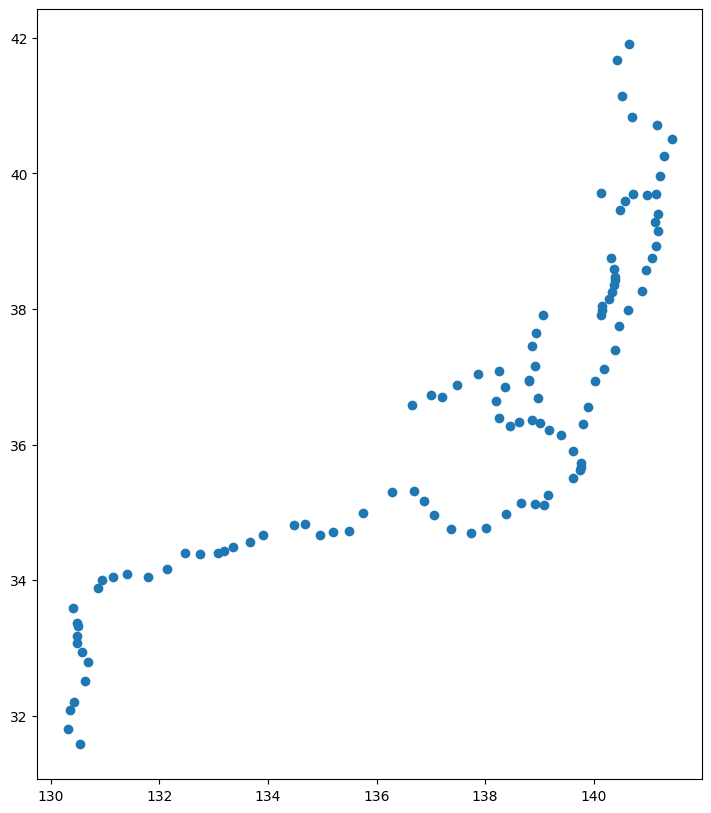

In [132]:
import geopandas as gpd
import matplotlib.pyplot as plt

japan_map = gpd.read_file('gm-jpn-all_u_2_2/rstatp_jpn.shp')
fig, ax = plt.subplots(figsize=(10, 10))
japan_map.plot(ax=ax)
japan_map.head()

,f_code,bst,use,soc,geometry
0,FA000,1,30,JPN,"LINESTRING (127.7608 26.12527, 127.7569 26.132..."
1,FA000,1,30,JPN,"LINESTRING (127.7028 26.169, 127.6995 26.16673..."
2,FA000,1,30,JPN,"LINESTRING (127.7304 26.09753, 127.7215 26.105..."
3,FA000,3,30,JPN,"LINESTRING (127.6516 26.1754, 127.6512 26.1748)"
4,FA000,1,30,JPN,"LINESTRING (127.7028 26.169, 127.7025 26.16987..."


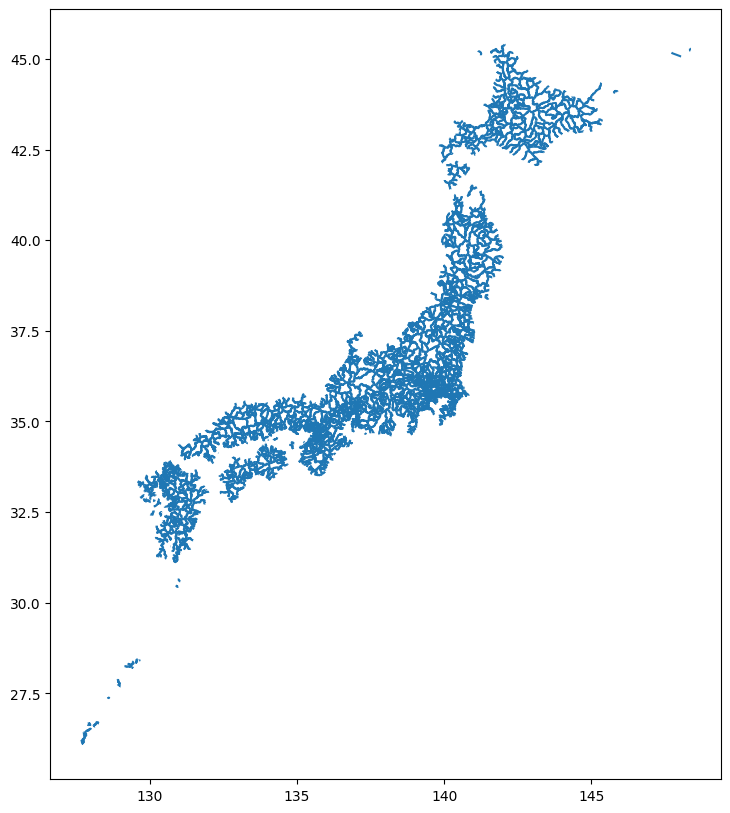

In [133]:
import geopandas as gpd
import matplotlib.pyplot as plt

japan_map = gpd.read_file('gm-jpn-all_u_2_2/polbndl_jpn.shp')
fig, ax = plt.subplots(figsize=(10, 10))
japan_map.plot(ax=ax)
japan_map.head()

In [134]:
#!unzip -q /content/N02-20_GML.zip -d ./

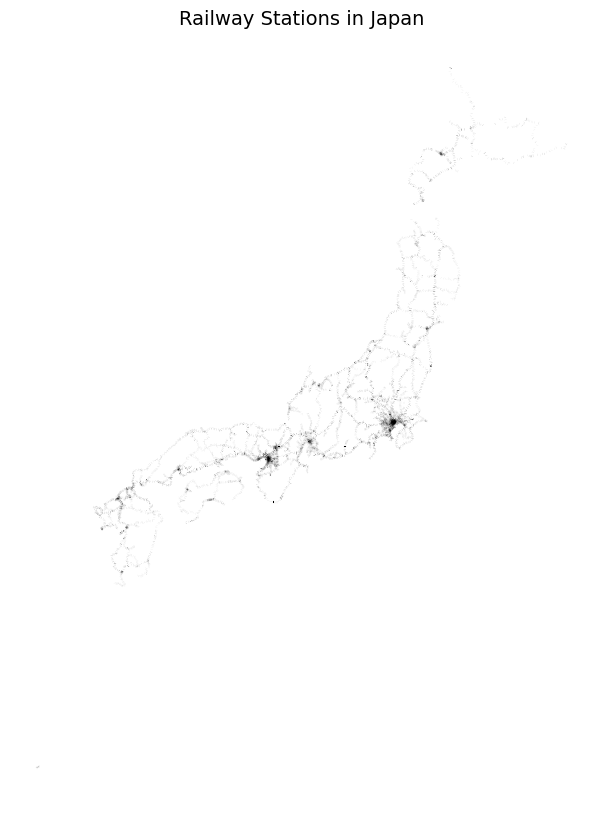

In [135]:
gml = gpd.read_file("UTF-8/N02-21_Station.shp")
fig, ax = plt.subplots(figsize=(8, 10))

gml.plot(
    ax=ax,
    color="black",
    markersize=1
)

ax.set_title("Railway Stations in Japan", fontsize=14)
ax.axis("off")

plt.show()


In [136]:
gml

,N02_001,N02_002,N02_003,N02_004,N02_005,geometry
0,11,2,æå®¿æå´ç·,ä¹å·æ å®¢éé,äºæç°,"LINESTRING (130.63035 31.25405, 130.62985 31.2..."
1,23,5,æ²ç¸é½å¸ã¢ãã¬ã¼ã«ç·,æ²ç¸é½å¸ã¢ãã¬ã¼ã«,å¤å³¶,"LINESTRING (127.70279 26.23035, 127.70309 26.2..."
2,24,5,æ±äº¬è¨æµ·æ°äº¤éè¨æµ·ç·,ããããã,ãå°å ´æµ·æµå ¬å,"LINESTRING (139.77818 35.62961, 139.77888 35.63)"
3,24,5,æ±äº¬è¨æµ·æ°äº¤éè¨æµ·ç·,ããããã,æ±äº¬å½éã¯ã«ã¼ãºã¿ã¼ããã«,"LINESTRING (139.77333 35.62109, 139.77288 35.6..."
4,24,5,æ±äº¬è¨æµ·æ°äº¤éè¨æµ·ç·,ããããã,ãã¬ã³ã ã»ã³ã¿ã¼,"LINESTRING (139.78001 35.61791, 139.77932 35.6..."
...,...,...,...,...,...,...
10217,12,4,ç¸éæ°æ¨ªæµç·,ç¸æ¨¡éé,è¥¿è°·,"LINESTRING (139.56433 35.47811, 139.56671 35.4..."
10218,21,4,ååç·,ä¼äºéé,è¥¿å ç«¯,"LINESTRING (132.75838 33.8403, 132.75779 33.8403)"
10219,21,4,èè¶å±æ¯ç·,é·å´é»æ°è»é,è¥¿æµçº,"LINESTRING (129.87624 32.74385, 129.87584 32.7..."
10220,21,4,é£çµ¡ç·,ä¼äºéé,ä¸ä¸ä¸,"LINESTRING (132.77544 33.84701, 132.77543 33.8..."


In [137]:
#!unzip -q /content/drive/MyDrive/MSDS/N03-20230101_GML.zip -d ./
with zipfile.ZipFile('N03-20230101_GML.zip', 'r') as zip_ref:
    zip_ref.extractall('N03-20230101_GML')

<Axes: >

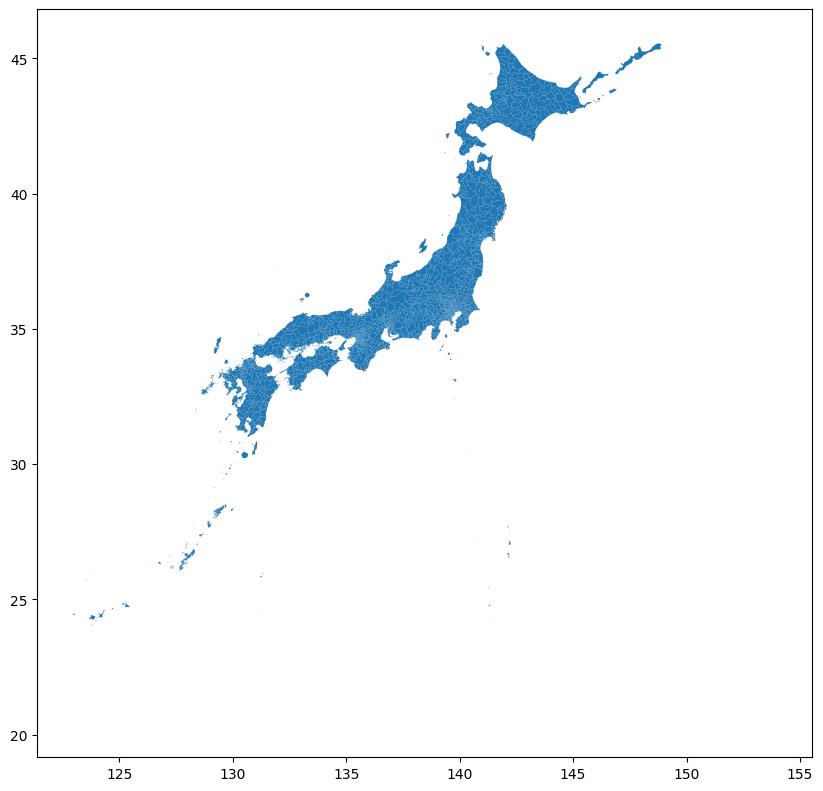

In [138]:
japan_map = gpd.read_file('N03-20230101_GML/N03-23_230101.shp')
fig, ax = plt.subplots(figsize=(10, 10))
japan_map.plot(ax=ax)

In [141]:
#!wget https://www.data.jma.go.jp/developer/xml/feed/eqvol_l.xml
import requests

url = "https://www.data.jma.go.jp/developer/xml/feed/eqvol_l.xml"
response = requests.get(url)

# ファイルとして保存
with open("eqvol_l.xml", "wb") as f:
    f.write(response.content)

In [142]:
eq = pd.read_xml('eqvol_l.xml')
eq.head()

,title,subtitle,updated,id,rel,href,type,rights,author,link,content
0,長期（地震火山）,None,None,None,None,None,None,None,None,NaN,None
1,None,JMAXML publishing feed,None,None,None,None,None,None,None,NaN,None
2,None,None,2026-01-01T20:01:11+09:00,None,None,None,None,None,None,NaN,None
3,None,None,None,https://www.data.jma.go.jp/developer/xml/feed/...,None,None,None,None,None,NaN,None
4,None,None,None,None,related,https://www.jma.go.jp/,None,None,None,NaN,None


In [143]:
eq2=eq[eq['type']!=None]
eq2

,title,subtitle,updated,id,rel,href,type,rights,author,link,content
0,長期（地震火山）,None,None,None,None,None,None,None,None,NaN,None
1,None,JMAXML publishing feed,None,None,None,None,None,None,None,NaN,None
2,None,None,2026-01-01T20:01:11+09:00,None,None,None,None,None,None,NaN,None
3,None,None,None,https://www.data.jma.go.jp/developer/xml/feed/...,None,None,None,None,None,NaN,None
4,None,None,None,None,related,https://www.jma.go.jp/,None,None,None,NaN,None
...,...,...,...,...,...,...,...,...,...,...,...
526,降灰予報（定時）,None,2025-12-25T14:00:00Z,https://www.data.jma.go.jp/developer/xml/data/...,None,None,None,None,\n,NaN,【火山名 諏訪之瀬島 降灰予報（定時）】 現在、諏訪之瀬島は噴火警戒レベル２（火口周辺規制）...
527,降灰予報（定時）,None,2025-12-25T14:00:00Z,https://www.data.jma.go.jp/developer/xml/data/...,None,None,None,None,\n,NaN,【火山名 霧島山（新燃岳） 降灰予報（定時）】 現在、霧島山（新燃岳）は噴火警戒レベル２（火...
528,降灰予報（定時）,None,2025-12-25T14:00:00Z,https://www.data.jma.go.jp/developer/xml/data/...,None,None,None,None,\n,NaN,【火山名 雌阿寒岳 降灰予報（定時）】 現在、雌阿寒岳は噴火警戒レベル２（火口周辺規制）です...
529,降灰予報（定時）,None,2025-12-25T14:00:00Z,https://www.data.jma.go.jp/developer/xml/data/...,None,None,None,None,\n,NaN,【火山名 岩手山 降灰予報（定時）】 現在、岩手山は噴火警戒レベル２（火口周辺規制）です。岩...


In [144]:
import re
import csv
import urllib.request
from bs4 import BeautifulSoup

output_file = "earthquake.csv"

header = ["ID","location","origintime","arrivaltime","latitude","longitude",
          "magnitude","prefecture","city","intensity","information"]

with open(output_file, 'w', encoding='utf-8') as f:
    writer = csv.writer(f, lineterminator="\n")
    writer.writerow(header)
    url = "https://www.data.jma.go.jp/developer/xml/feed/eqvol_l.xml"
    res = urllib.request.urlopen(url).read()
    soup = BeautifulSoup(res, "html.parser")
    search = re.compile('.*VXSE.*')

    for vxse in soup.find_all(text=search):

        res = urllib.request.urlopen(vxse).read()
        soup = BeautifulSoup(res)
        event_id = soup.find("eventid").text

        for content in soup.find_all("body"):
            earthquake = content.find("earthquake")
            if earthquake is not None:
                location = earthquake.find("name").text
                origintime = earthquake.find("origintime").text
                arrivaltime = earthquake.find("arrivaltime").text

                coordinate = earthquake.find("jmx_eb:coordinate").text
                lat = coordinate[1:coordinate[1:].find("+") + 1]
                lon = coordinate[coordinate[1:].find("+") + 2:coordinate[1:].find("+") + 7]
                lat = int(lat[0:2])+(int(lat[3:])/60)+(0/3600)
                lon = int(lon[0:3])+(int(lon[4:])/60)+(0/3600)
                magnitude = earthquake.find("jmx_eb:magnitude").text

            intensity = content.find("intensity")
            if intensity is not None:
                for pref in intensity.find_all("pref"):

                    prefectuer = pref("name")[0].text

                    for city in pref.find_all("city"):
                        city_name = city("name")[0].text
                        maxint = city("maxint")[0].text
                        if  True:

                                write_list = []
                                write_list.append(event_id)
                                write_list.append(location)
                                write_list.append(origintime)
                                write_list.append(arrivaltime)
                                write_list.append(lat)
                                write_list.append(lon)
                                write_list.append(magnitude)
                                write_list.append(prefectuer)
                                write_list.append(city_name)
                                write_list.append(maxint)

                                intensity_station = ""
                                for intensitystation in pref.find_all("intensitystation"):
                                    intensity_station = intensity_station + intensitystation("name")[0].text + " "

                                write_list.append(intensity_station)
                                writer.writerow(write_list)

C:\Users\user\AppData\Local\Programs\Python\Python312\Lib\html\parser.py:171: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML parser will be more reliable. To parse this document as XML, make sure you have the lxml package installed, and pass the keyword argument `features="xml"` into the BeautifulSoup constructor.
  k = self.parse_starttag(i)
C:\Users\user\AppData\Local\Temp\ipykernel_12132\3031961162.py:19: DeprecationWarning: The 'text' argument to find()-type methods is deprecated. Use 'string' instead.
  for vxse in soup.find_all(text=search):
C:\Users\user\AppData\Local\Temp\ipykernel_12132\3031961162.py:22: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's

In [145]:
import pandas as pd
earthquake = pd.read_csv('earthquake.csv')

In [ ]:
import folium



# Define the coordinates for the center of the map
center_lat, center_lon = 35.68, 139.76

# Create a folium Map object centered on Japan
map = folium.Map(location=[center_lat, center_lon], zoom_start=5)

# Iterate through the rows of the dataframe and add a marker for each earthquake
for index, row in earthquake.iterrows():
    lat, lon = row['latitude'], row['longitude']
    title = row['location']
    magnitude = row['magnitude']
    popup = f"{title} - Magnitude {magnitude} at {row['origintime']}"
    folium.Marker([lat, lon], popup=popup).add_to(map)

map.save('map.html')
map